# OpenCV

In [57]:
import tensorflow as tf
tf.__version__

'2.15.0'

In [58]:
import cv2
cv2.__version__

'4.8.1'

In [59]:
from tensorflow.keras.datasets import mnist
import cv2
import numpy as na
import matplotlib.pyplot as plt

In [60]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

In [61]:
type(X_train), X_train.dtype, X_train.ndim, X_train.shape, X_train.size

(numpy.ndarray, dtype('uint8'), 3, (60000, 28, 28), 47040000)

## 이미지 읽고 출력
- pixabay 무료 이미지 소스 가져오기

In [62]:
# 이미지 읽어오기
img = cv2.imread('./data/car.jpg')

In [63]:
img.shape

(826, 1280, 3)

In [64]:
# 이미지 출력
image = cv2.imread('./data/car.jpg', cv2.IMREAD_ANYCOLOR) # BGR로 인식하므로 컨버팅 필요
image.shape

(826, 1280, 3)

In [65]:
type(image), image.dtype, image.ndim, image.shape, image.size

(numpy.ndarray, dtype('uint8'), 3, (826, 1280, 3), 3171840)

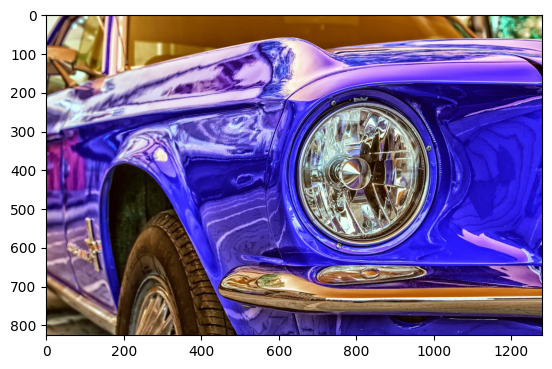

In [66]:
plt.imshow(image)

## 컨버팅

### 왜 OpenCV는 BGR을 쓸까?
일반적인 방법인 PIL로 이미지를 읽으면 RGB 순서로, OpenCV로 읽으면(cv2.imread 등) BGR순서로 이미지가 읽힌다.   
RGB, BGR 각각 Color space 또는 Color system을 말하며, 유추할 수 있듯 색상이 저장되는 순서가 서로 정반대이다.
https://blog.xcoda.net/102   
그 당시, BGR을 많이 사용했기 때문에 / 카메라는 BGR 순서로 많이 사용

In [67]:
def imginfo(image):
    print(type(image), image.dtype, image.ndim, image.shape, image.size)

<class 'numpy.ndarray'> uint8 3 (826, 1280, 3) 3171840


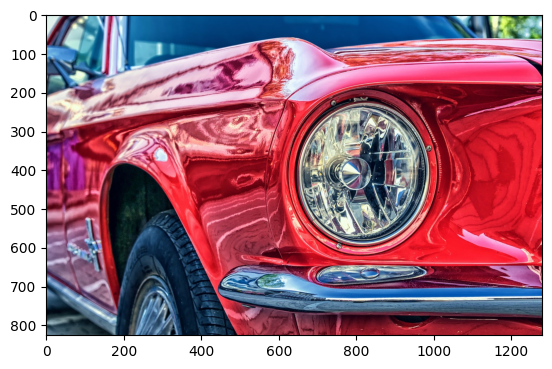

In [68]:
# bgr => rgb
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # RGB로 컨버팅
plt.imshow(image)
# plt.show()# 객체 디스크립션 숨김
imginfo(image)

<class 'numpy.ndarray'> uint8 2 (826, 1280) 1057280


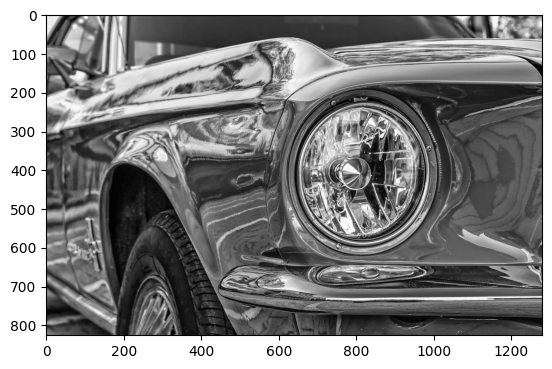

In [69]:
# bgr => gray
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap='gray')
imginfo(gray)

In [70]:
gray[0], imginfo(gray[0])

<class 'numpy.ndarray'> uint8 1 (1280,) 1280


(array([232, 232, 232, ..., 108,  99, 100], dtype=uint8), None)

<class 'numpy.ndarray'> uint8 3 (826, 1280, 3) 3171840


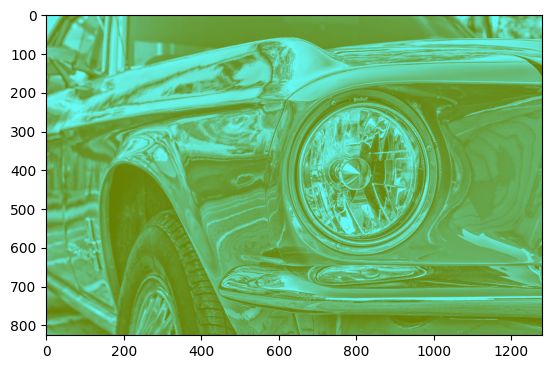

In [71]:
# gray => colormap
im_color = cv2.applyColorMap(gray, cv2.COLORMAP_SUMMER)
plt.imshow(im_color)
imginfo(im_color)

<class 'numpy.ndarray'> uint8 3 (826, 1280, 3) 3171840


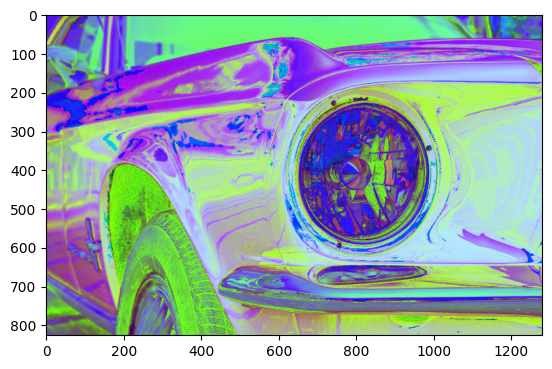

In [72]:
# gray => colormap
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.imshow(hsv)
imginfo(hsv)

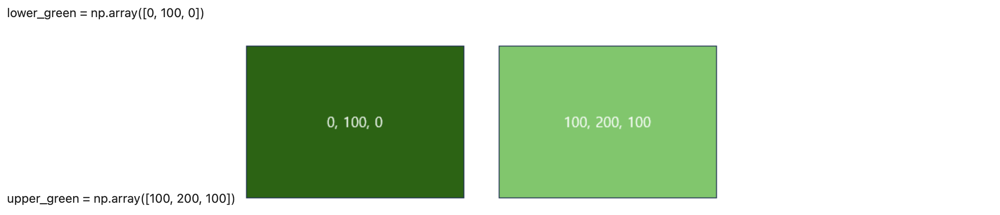

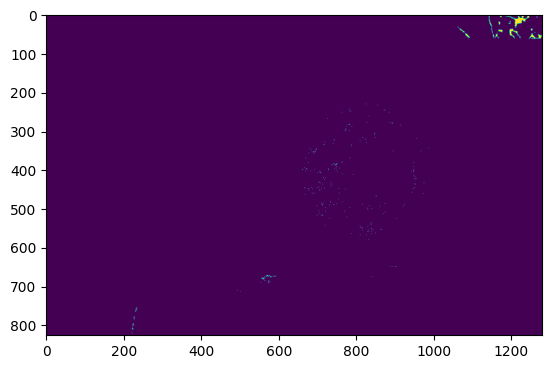

In [73]:
# 그린 색상 마스킹 = 크로마키
import numpy as np
lower_green = np.array([0, 100, 0])
upper_green = np.array([100, 200, 100])
mask_green = cv2.inRange(image, lower_green, upper_green)
plt.imshow(mask_green)

## 크기 조절
- 보간법 : 이미지의 크기를 변경하는 경우, 변형된 이미지의 픽셀은 추정해서 값을 할당해야 합니다.
이미지의 비율을 변경하면 존재하지 않는 영역에 새로운 픽셀값을 매핑하거나 존재하는 픽셀들을 압축해서 새로운 값을 할당해야 합니다.   
이를 이미지 상에 존재하는 픽셀 데이터들에 대해 근사 함수를 적용해서 새로운 픽셀 값을 구하는 것으로 이해할 수 있습니다.    
그러므로, 추정해야 하는 픽셀은 보간법을 이용하여 픽셀들의 값을 할당합니다.    

In [74]:
height, width, channel = image.shape
height, width, channel

(826, 1280, 3)

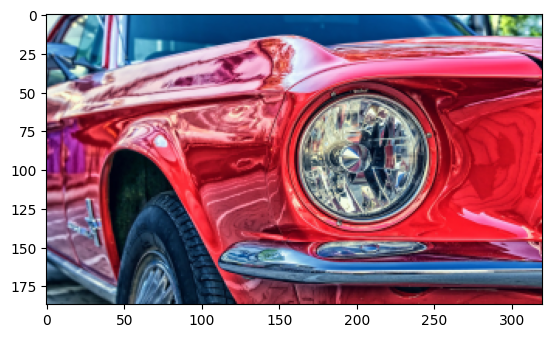

In [76]:
# 크기 조절
dst = cv2.resize(image, dsize=(320,187), interpolation=cv2.INTER_AREA) #interpolation 보간
plt.imshow(dst)

<class 'numpy.ndarray'> uint8 3 (578, 384, 3) 665856


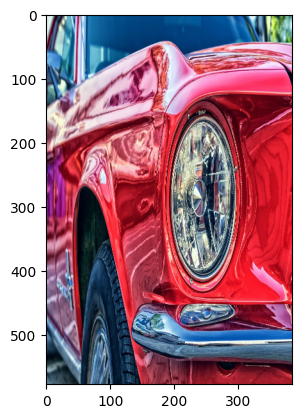

In [77]:
# 비율로 크기 조절
dst = cv2.resize(image, dsize=(0,0), fx=0.3, fy=0.7, interpolation=cv2.INTER_LINEAR) # X축기준으로 30%, Y축 기준으로 70% 크기 조절, dzie(0,0)하면 비율 적용
plt.imshow(dst)
imginfo(dst)

<class 'numpy.ndarray'> uint8 3 (1652, 2560, 3) 12687360


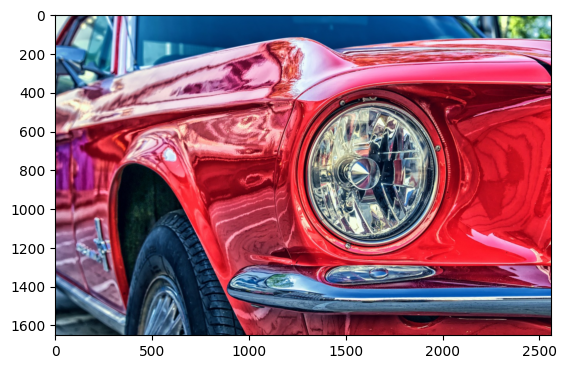

In [78]:
# 확대, 축소
dst3 = cv2.pyrUp(image, dstsize=(width*2, height*2))
plt.imshow(dst3)
imginfo(dst3)

<class 'numpy.ndarray'> uint8 3 (413, 640, 3) 792960


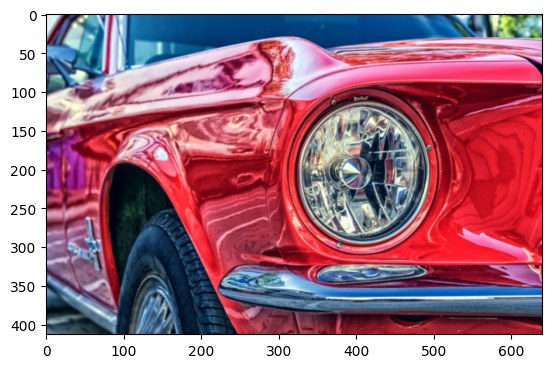

In [79]:
# 이미지 축소 메서드
dst4 = cv2.pyrDown(image)
plt.imshow(dst4)
imginfo(dst4)

## 자르기

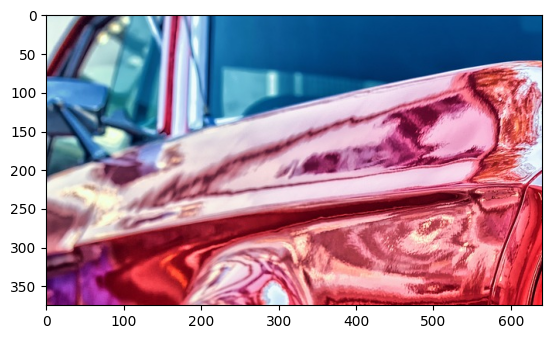

In [80]:
dst5 = image[:375, :641]
plt.imshow(dst5)

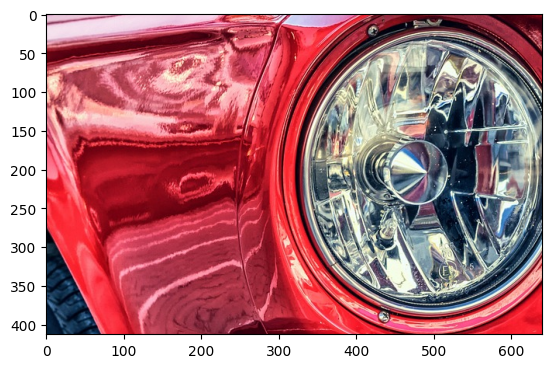

In [81]:
# 가운데 중심점을 기준으로 50% 이미지 잘라내기
# 가운데 중심점 : height/2, width/2, 
# 시작위치 : height/2 – height/4,
# 끝위치: height/2 + height/4를 계산
# image[y범위, x범위]

dst6 = image[int(height/2-height/4):int(height/2+height/4), # y 범위
             int(width/2-width/4):int(width/2+width/4)] # x범위
plt.imshow(dst6)

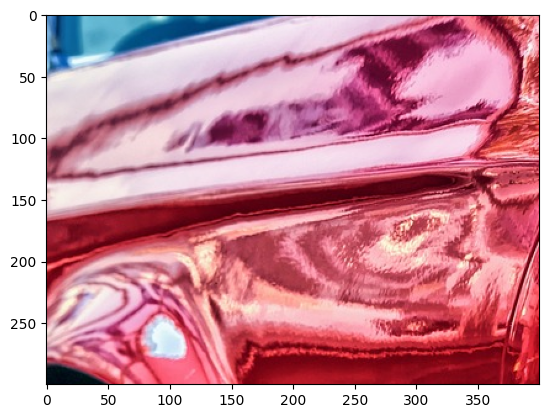

In [82]:
import tensorflow as tf
# IMAGE CROP
dst14 = tf.image.crop_to_bounding_box(image, 100, 200, 300, 400) # BOX좌표 
# offset_height(위에서 아래로 +100), offset_width(좌에서 우방향으로 +200), 
# target_height(offset지점에서부터 높이+300), target_width(offset지점부터 +400)
plt.imshow(dst14)

## 이동

In [83]:
rows, cols, channels = img.shape
img.shape

(826, 1280, 3)

In [84]:
cv2.warpAffine?

Docstring:
warpAffine(src, M, dsize[, dst[, flags[, borderMode[, borderValue]]]]) -> dst
.   @brief Applies an affine transformation to an image.
.   
.   The function warpAffine transforms the source image using the specified matrix:
.   
.   \f[\texttt{dst} (x,y) =  \texttt{src} ( \texttt{M} _{11} x +  \texttt{M} _{12} y +  \texttt{M} _{13}, \texttt{M} _{21} x +  \texttt{M} _{22} y +  \texttt{M} _{23})\f]
.   
.   when the flag #WARP_INVERSE_MAP is set. Otherwise, the transformation is first inverted
.   with #invertAffineTransform and then put in the formula above instead of M. The function cannot
.   operate in-place.
.   
.   @param src input image.
.   @param dst output image that has the size dsize and the same type as src .
.   @param M \f$2\times 3\f$ transformation matrix.
.   @param dsize size of the output image.
.   @param flags combination of interpolation methods (see #InterpolationFlags) and the optional
.   flag #WARP_INVERSE_MAP that means that M is the inverse transf

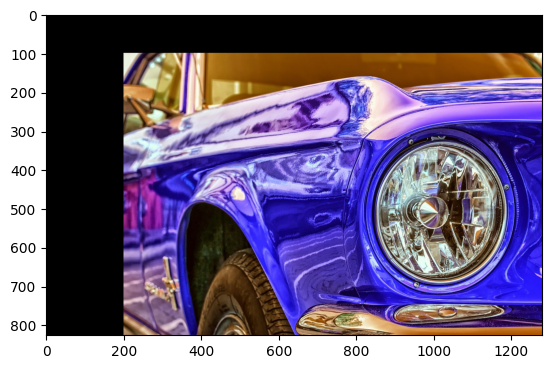

In [85]:
m = np.float32([[1,0,200],[0,1,100]]) # [x축 True, y축 false, 이동 200], [x축 false, y축 True, 이동 100]
dst = cv2.warpAffine(img, m, (cols,rows))
plt.imshow(dst)

## 회전

In [86]:
cv2.getRotationMatrix2D?

Docstring:
getRotationMatrix2D(center, angle, scale) -> retval
.   @brief Calculates an affine matrix of 2D rotation.
.   
.   The function calculates the following matrix:
.   
.   \f[\begin{bmatrix} \alpha &  \beta & (1- \alpha )  \cdot \texttt{center.x} -  \beta \cdot \texttt{center.y} \\ - \beta &  \alpha &  \beta \cdot \texttt{center.x} + (1- \alpha )  \cdot \texttt{center.y} \end{bmatrix}\f]
.   
.   where
.   
.   \f[\begin{array}{l} \alpha =  \texttt{scale} \cdot \cos \texttt{angle} , \\ \beta =  \texttt{scale} \cdot \sin \texttt{angle} \end{array}\f]
.   
.   The transformation maps the rotation center to itself. If this is not the target, adjust the shift.
.   
.   @param center Center of the rotation in the source image.
.   @param angle Rotation angle in degrees. Positive values mean counter-clockwise rotation (the
.   coordinate origin is assumed to be the top-left corner).
.   @param scale Isotropic scale factor.
.   
.   @sa  getAffineTransform, warpAffine, transform
Typ

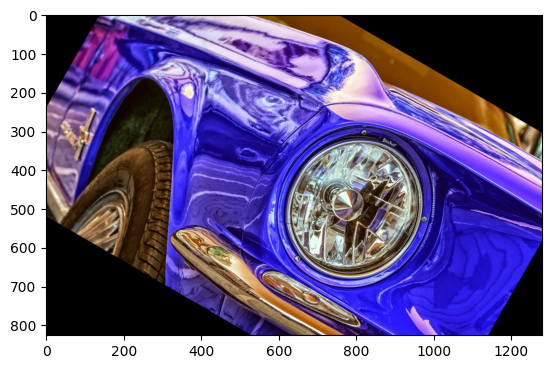

In [87]:
# 중심점에서 30도 시계방향
M = cv2.getRotationMatrix2D((cols/2, rows/2), -30, 1) 
rotate_30 = cv2.warpAffine(img, M, (cols,rows))
plt.imshow(rotate_30)

## 흐리게, 선명하게
이미지 또는 영상을 흐릿하게 만드는 원리는,    
다음과 같은 kernel를 전체 이미지에 convolution을 돌림으로써, 커널 사이즈에 맞게 픽셀 평균값을 대입하는 것입니다.    
즉, 특정 픽셀의 주변 값의 평균(또는 임의의 array 연산)값을 해당 픽셀에 넣는 것입니다.   
2D Convolution kernel의 원리는 딥러닝에서도 CNN이라는 유명 알고리즘에 사용되는 동일한 방식입니다.    

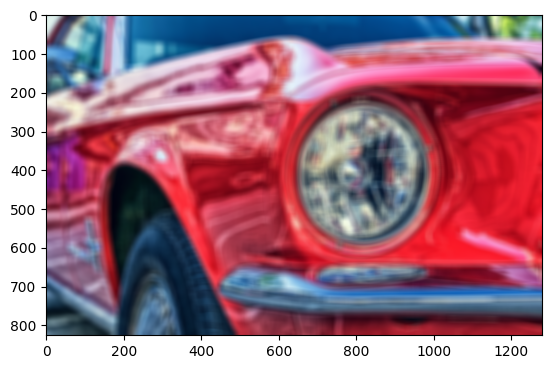

In [89]:
dst7 = cv2.blur(image, (20, 20)) # 값이 커질수록 더 흐려짐 , 필터의 컨벌루션
plt.imshow(dst7)

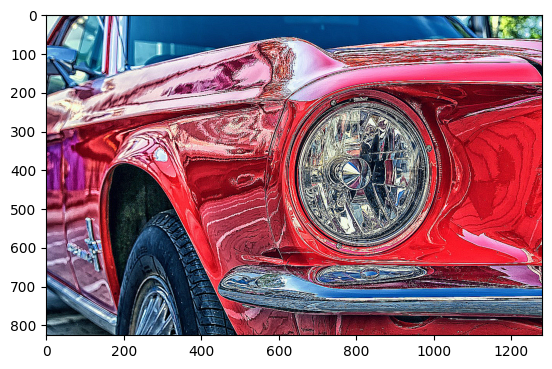

In [90]:
# 중앙값을 키워주는 형태의 마스크를 만든 후 적용하여 특징을 강조
# sharpening ; 주변 pixel과의 차이를 극대화시켜 경계부분의 명암비를 증가시키는 작업
# 주변부의 픽셀값을 감소시킬때, 강조될 강도를 mask중앙에 지정하고  주변부의 값을 줄여 총합이 1이 되도록 mask 생성
kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]) # 필터 ,
dst8 = cv2.filter2D(image, -1, kernel) #두번째 인자인 ddepth은 출력영상의 데이터타입으로 default는 -1로 입력과 동일한 타입으로 출력
plt.imshow(dst8)

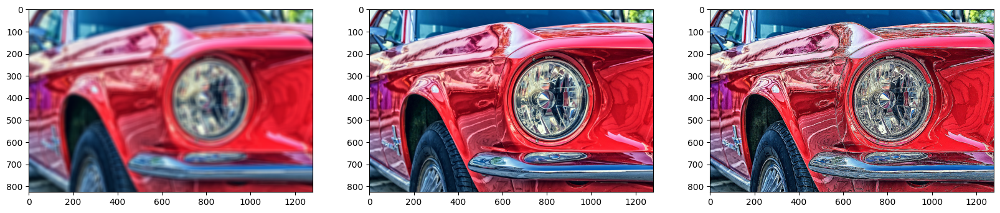

In [94]:
fig, ax = plt.subplots(1, 3, figsize = (20, 10))
ax[0].imshow(dst7)
ax[1].imshow(image)
ax[2].imshow(dst8)

## 대칭

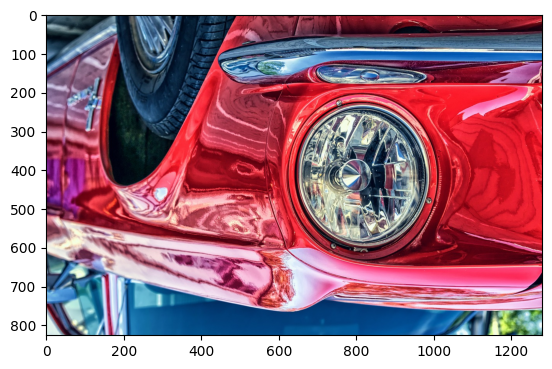

In [95]:
# 상하 대칭
dst9 = cv2.flip(image, 0)
plt.imshow(dst9)

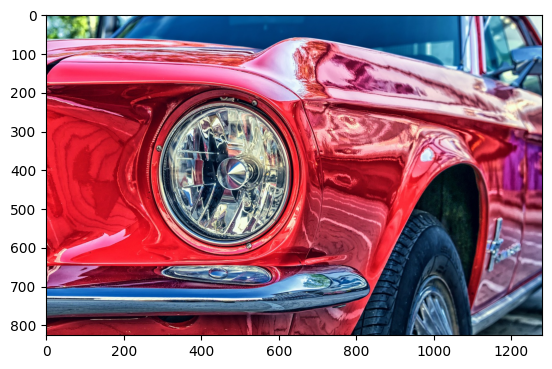

In [96]:
# 좌우 대칭
dst10 = cv2.flip(image, 1)
plt.imshow(dst10)

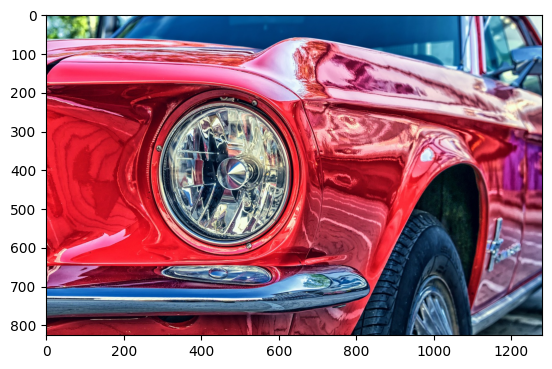

In [97]:
import tensorflow as tf
dst15 = tf.image.flip_left_right(image)
plt.imshow(dst15)

## 경계 추출, 엣지
canny 알고리즘을 이용해서 경계를 추출합니다.    
뒤의 숫자 개는 경계점을 정하는 값으로 클수록 엣지 추출값이 적어집니다.   
앞의 숫자는 minVal로 이 수치가 적어지면 인근 엣지와 더 잘 연결됩니다.   
뒤의 숫자는 maxvVal로 이 수치가 적어지면 엣지 추출이 많아집니다.   
https://engineer-mole.tistory.com/243

In [98]:
cv2.Canny?

Docstring:
Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges
.   @brief Finds edges in an image using the Canny algorithm @cite Canny86 .
.   
.   The function finds edges in the input image and marks them in the output map edges using the
.   Canny algorithm. The smallest value between threshold1 and threshold2 is used for edge linking. The
.   largest value is used to find initial segments of strong edges. See
.   <http://en.wikipedia.org/wiki/Canny_edge_detector>
.   
.   @param image 8-bit input image.
.   @param edges output edge map; single channels 8-bit image, which has the same size as image .
.   @param threshold1 first threshold for the hysteresis procedure.
.   @param threshold2 second threshold for the hysteresis procedure.
.   @param apertureSize aperture size for the Sobel operator.
.   @param L2gradient a flag, indicating whether a more accurate \f$L_2\f$ norm
.   \f$=\sqrt{(dI/dx)^2 + (dI/dy)^2}\f$ should be used to calculate the imag

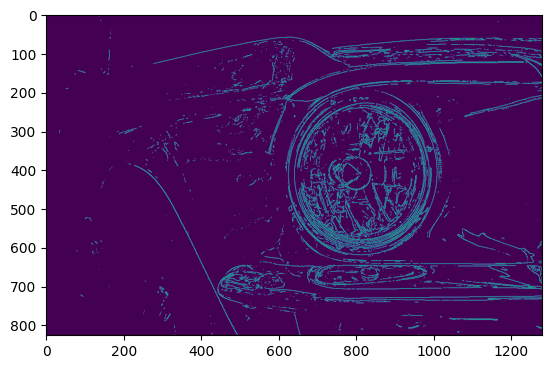

In [100]:
dst11 = cv2.Canny(image, 500, 500) #    (src, 작아질수록 엣지가 연결이 더 잘됨, 작아질수록 엣지추출이 많아짐)
plt.imshow(dst11)

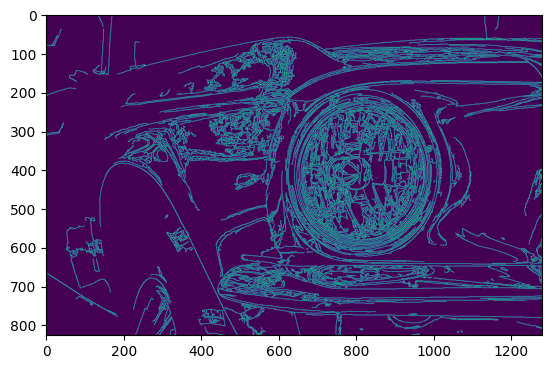

In [102]:
dst11 = cv2.Canny(image, 50, 500)
plt.imshow(dst11)

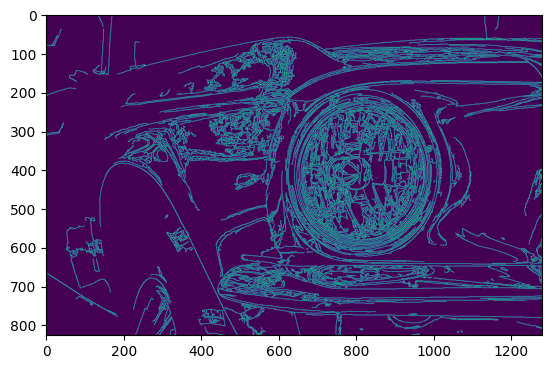

In [106]:
dst11 = cv2.Canny(image, 500, 50) #    (src, 작아질수록 엣지가 연결이 더 잘됨 , 작아질수록 엣지추출이 많아짐)
plt.imshow(dst11)

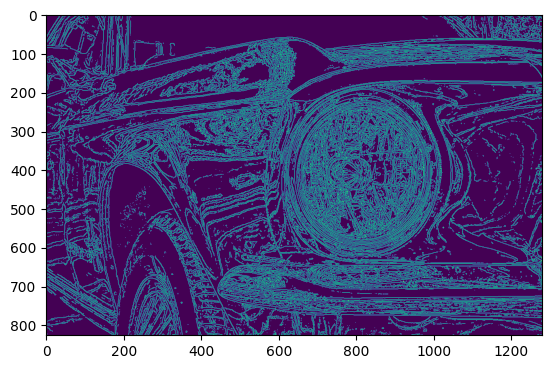

In [104]:
dst11 = cv2.Canny(image, 100, 100)
plt.imshow(dst11)

## 이미지 저장

In [107]:
# 미변환하면 색상값이 BGR로 변경되므로 컨버팅 필요
# 변환 전
cv2.imwrite('data/car_resize1.jpg', dst6)

True

In [109]:
# 변환 후
dst6_BGR = cv2.cvtColor(dst6, cv2.COLOR_BGR2RGB)
cv2.imwrite('data/car_resize2.jpg', dst6_BGR)

True

## 연습문제
- 다양한 처리기법을 포함한 랜덤 이미지 변환 함수를 만들어보세요.
- image폴더 안에 있는 모든 이미지에 랜덤변환함수를 적용하여 result 폴더에 저장하세요

In [110]:
import glob
img_paths = glob.glob('./data/image/*')
img_paths

['./data/image/2_21.jpg',
 './data/image/2_20.jpg',
 './data/image/2_22.jpg',
 './data/image/2_8.jpg',
 './data/image/2_9.jpg',
 './data/image/2_23.jpg',
 './data/image/2_24.jpg',
 './data/image/2_18.jpg',
 './data/image/2_19.jpg',
 './data/image/2_25.jpg',
 './data/image/1_13.jpg',
 './data/image/1_12.jpg',
 './data/image/1_10.jpg',
 './data/image/1_9.jpg',
 './data/image/1_8.jpg',
 './data/image/1_11.jpg',
 './data/image/1_15.jpg',
 './data/image/1_14.jpg',
 './data/image/1_16.jpg',
 './data/image/1_17.jpg',
 './data/image/1_3.jpg',
 './data/image/1_2.jpg',
 './data/image/1_19.jpg',
 './data/image/1_0.jpg',
 './data/image/1_1.jpg',
 './data/image/1_18.jpg',
 './data/image/1_20.jpg',
 './data/image/1_5.jpg',
 './data/image/1_4.jpg',
 './data/image/1_21.jpg',
 './data/image/1_6.jpg',
 './data/image/1_7.jpg',
 './data/image/2_14.jpg',
 './data/image/2_2.jpg',
 './data/image/2_3.jpg',
 './data/image/2_15.jpg',
 './data/image/2_17.jpg',
 './data/image/2_1.jpg',
 './data/image/2_0.jpg',
 '

In [129]:
import random

def random_preprocessing(img):
    h, w, c = img.shape
    # 1. 크기 조절 (512, 512)
    img_ = cv2.resize(img, dsize=(512, 512))
    # 2. 랜덤 크롭
    i = random.randint(0, h-256)
    j = random.randint(0, w-256)
    img_ = img_[i:i+256, j:j+256]
    return img

In [130]:
for i, path in enumerate(img_paths):
    img = cv2.imread(path)
    img_ = random_preprocessing(img)
    f_name = path.split('/')[-1]
    cv2.imwrite('./data/result/'+f_name, img_)
    print(f'{i+1}번째 변환 완료')
print('전체 변환 완료')

1번째 변환 완료
2번째 변환 완료
3번째 변환 완료
4번째 변환 완료
5번째 변환 완료
6번째 변환 완료
7번째 변환 완료
8번째 변환 완료
9번째 변환 완료
10번째 변환 완료
11번째 변환 완료
12번째 변환 완료
13번째 변환 완료
14번째 변환 완료
15번째 변환 완료
16번째 변환 완료
17번째 변환 완료
18번째 변환 완료
19번째 변환 완료
20번째 변환 완료
21번째 변환 완료
22번째 변환 완료
23번째 변환 완료
24번째 변환 완료
25번째 변환 완료
26번째 변환 완료
27번째 변환 완료
28번째 변환 완료
29번째 변환 완료
30번째 변환 완료
31번째 변환 완료
32번째 변환 완료
33번째 변환 완료
34번째 변환 완료
35번째 변환 완료
36번째 변환 완료
37번째 변환 완료
38번째 변환 완료
39번째 변환 완료
40번째 변환 완료
41번째 변환 완료
42번째 변환 완료
43번째 변환 완료
44번째 변환 완료
45번째 변환 완료
46번째 변환 완료
47번째 변환 완료
48번째 변환 완료
전체 변환 완료
